In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.5.16-py3-none-any.whl size=110683 sha256=59bce27d0c0b6058142c1f6983b199cdb59492a7d75096459edf9ced796f778c
  Stored in directory: /root/.cache/pip/wheels/43/4b/fb/736478af5e8004810081a06259f9aa2f7c3329fc5d03c2c412
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.16
    Uninstalling kaggle-1.5.16:
      Successfully uninstalled kaggle-1.5.16


In [ ]:
pip install opencv-python

In [9]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import random
import os, cv2, json
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.applications import EfficientNetB4
from keras.optimizers import Adam

# ignoring warnings
import warnings
warnings.simplefilter("ignore")

In [10]:
# Clear any logs from previous tensorboard runs
!rm -rf ./logs/
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
pip install google-colab

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.7 MB/s eta 0:00:00


In [11]:
from google.colab import files
data_to_load = files.upload()

Saving kaggle.json to kaggle (1).json


In [15]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Data Collection and EDA

In [17]:
!kaggle competitions download -c cassava-leaf-disease-classification --force

100% 5.76G/5.76G [04:18<00:00, 24.3MB/s]
100% 5.76G/5.76G [04:18<00:00, 23.9MB/s]


In [7]:
import zipfile
zip_ref = zipfile.ZipFile('cassava-leaf-disease-classification.zip', 'r')
zip_ref.extractall('cassava-leaf-disease-classification')
zip_ref.close()

In [18]:
WORK_DIR = os.getcwd()+'/cassava-leaf-disease-classification'
os.listdir(WORK_DIR)

['test_images',
 'test_tfrecords',
 'label_num_to_disease_map.json',
 'train_tfrecords',
 'train_images',
 'sample_submission.csv',
 'train.csv']

In [19]:
print('Train images: %d' %len(os.listdir(
    os.path.join(WORK_DIR, "train_images"))))

Train images: 21397


In [20]:
with open(os.path.join(WORK_DIR, "label_num_to_disease_map.json")) as file:
    print(json.dumps(json.loads(file.read()), indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


In [21]:
train_labels = pd.read_csv(os.path.join(WORK_DIR, "train.csv"))
train_labels.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


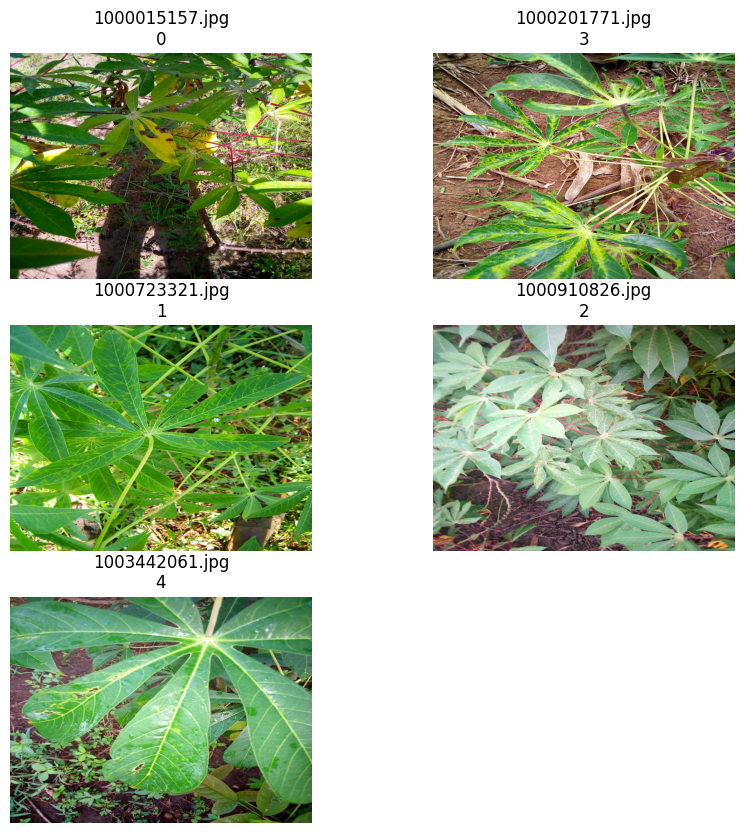

In [22]:
# Image sample from 5 different classes
sample_images = ['1000015157.jpg','1000723321.jpg','1000910826.jpg','1000201771.jpg','1003442061.jpg']
sample_images_df = train_labels[train_labels.image_id.isin(sample_images)]
plt.figure(figsize=(10,10))
for ind, (image_id, label) in enumerate(zip(sample_images_df.image_id, sample_images_df.label)):
    plt.subplot(3, 2, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.title('{}\n{}'.format(image_id,label))
    plt.imshow(image)
    plt.axis("off")

plt.show()

Data Imbalance

<Axes: xlabel='label', ylabel='count'>

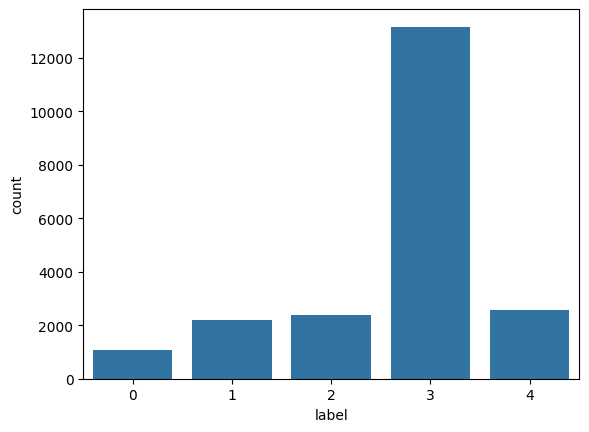

In [23]:
df = pd.read_csv(os.path.join(WORK_DIR, "train.csv"))
sns.countplot(x=df["label"])


We have imbalanced data with domination of third class: "Cassava Mosaic Disease (CMD)".

### Some photos of dominant class (with CMD)

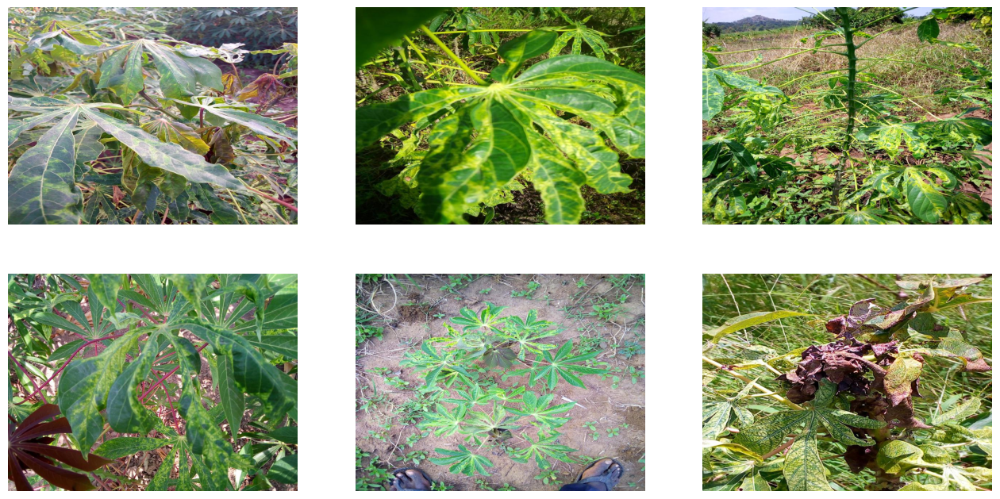

In [24]:
sample = train_labels[train_labels.label == 3].sample(6)
plt.figure(figsize=(16, 8))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(2, 3, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.show()

Sample Photos of Cassava Bacterial Blight (CBB)

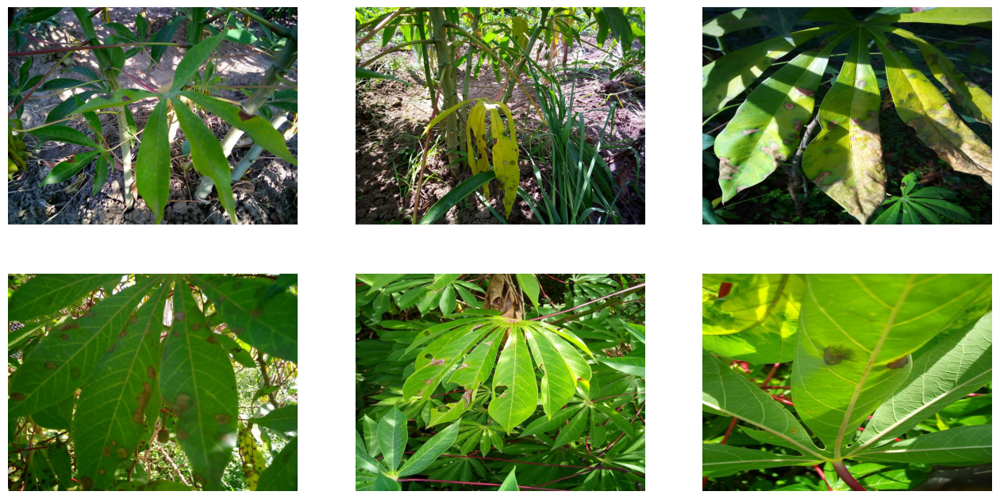

In [25]:
sample = train_labels[train_labels.label == 0].sample(6)
plt.figure(figsize=(16, 8))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(2, 3, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.show()

Sample Photos of Cassava Brown Streak Disease (CBSD)

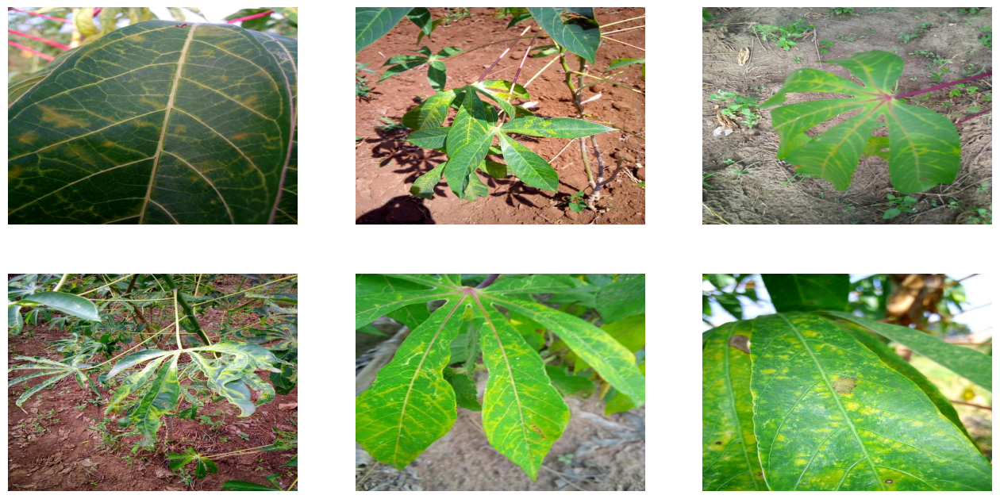

In [26]:
sample = train_labels[train_labels.label == 1].sample(6)
plt.figure(figsize=(16, 8))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(2, 3, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.show()

Sample Photos of Cassava Green Mottle (CGM)

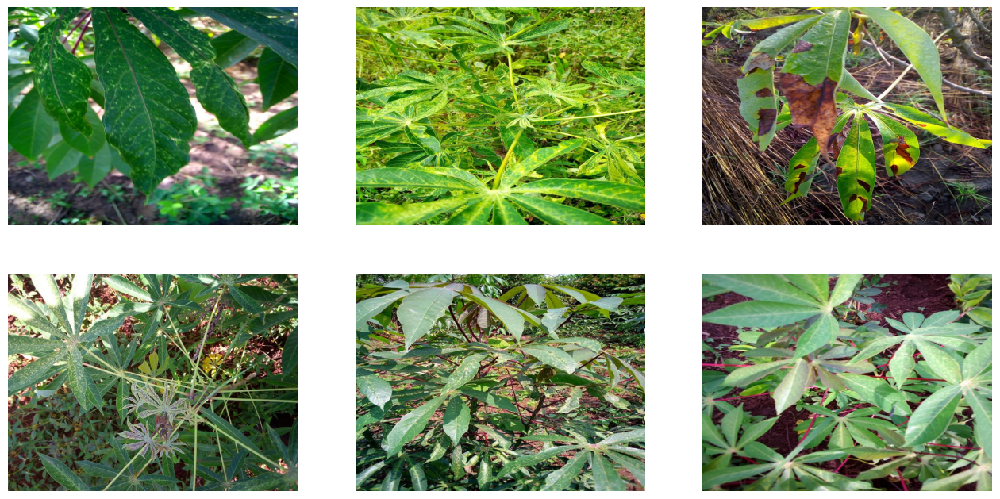

In [27]:
sample = train_labels[train_labels.label == 2].sample(6)
plt.figure(figsize=(16, 8))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(2, 3, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.show()

### Some photos of healthy plants

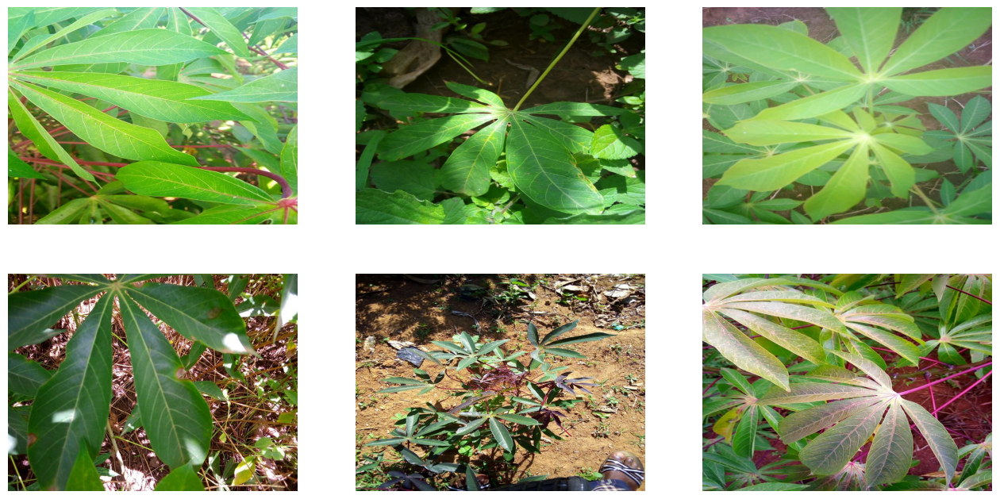

In [28]:
sample = train_labels[train_labels.label == 4].sample(6)
plt.figure(figsize=(16, 8))
for ind, (image_id, label) in enumerate(zip(sample.image_id, sample.label)):
    plt.subplot(2, 3, ind + 1)
    image = cv2.imread(os.path.join(WORK_DIR, "train_images", image_id))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.show()

## The baseline level of accuracy

In [29]:
y_pred = [3] * len(train_labels.label)
print('The baseline accuracy: %.3f'
      %accuracy_score(y_pred, train_labels.label,normalize=True))

The baseline accuracy: 0.615


Our future model must have accuracy better than 0.615.

1.   List item
2.   List item



> Indented block



## Image Preprocessing

In [43]:
BATCH_SIZE = 16
# STEPS_PER_EPOCH = len(train_labels)*0.8 / BATCH_SIZE
# VALIDATION_STEPS = len(train_labels)*0.2 / BATCH_SIZE
num_train_samples = len(train_labels) * 0.8
num_val_samples = len(train_labels) * 0.2
import math
# Use math.ceil to ensure whole numbers for steps
STEPS_PER_EPOCH = math.ceil(num_train_samples / BATCH_SIZE)
VALIDATION_STEPS = math.ceil(num_val_samples / BATCH_SIZE)

EPOCHS = 10
TARGET_SIZE = 299

In [44]:
 train_labels.label = train_labels.label.astype('str')
#validation_split parameter allows for us to split 20% of the data into the validation set automatically without train test split
#Then you can allow .flow_from_dataframe to breakout the train versus validation in the data
train_generator = ImageDataGenerator(validation_split = 0.2,
                                     preprocessing_function = None,
                                     zoom_range = 0.2,
                                     cval = 0.2,
                                     horizontal_flip = True,
                                     vertical_flip = True,
                                     rotation_range = 5,
                                     fill_mode = 'constant',
                                     shear_range = 0.2,
                                     height_shift_range = 0.2,
                                     width_shift_range = 0.2) \
    .flow_from_dataframe(train_labels,
                         directory = os.path.join(WORK_DIR, "train_images"),
                         subset = "training",
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                         class_mode = "sparse")

validation_generator = ImageDataGenerator(validation_split = 0.2) \
    .flow_from_dataframe(train_labels,
                         directory = os.path.join(WORK_DIR, "train_images"),
                         subset = "validation",
                         x_col = "image_id",
                         y_col = "label",
                         target_size = (TARGET_SIZE, TARGET_SIZE),
                         batch_size = BATCH_SIZE,
                         class_mode = "sparse")

Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


Sample Output of Training Image Augmentation

1.   List item
2.   List item



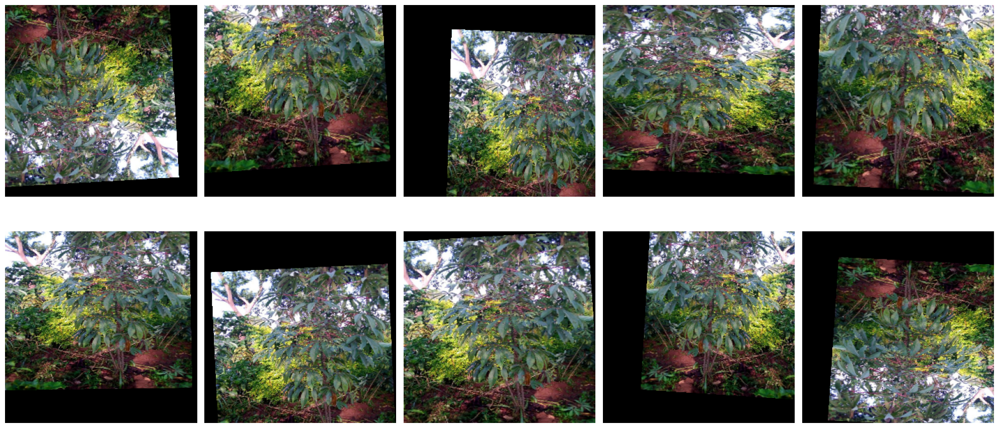

In [45]:
aug_trainimages = [train_generator[0][0][0]/255 for i in range(10)]
fig, axes = plt.subplots(2, 5, figsize = (20, 10))
axes = axes.flatten()
for img, ax in zip(aug_trainimages, axes):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()

## Modeling

In [46]:
def create_model():
    model = models.Sequential()

    model.add(EfficientNetB4(include_top = False, weights = 'imagenet', input_shape = (TARGET_SIZE, TARGET_SIZE, 3)))

    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dense(5, activation = "softmax"))

    model.compile(optimizer = Adam(learning_rate = 0.001), loss = "sparse_categorical_crossentropy",
                  metrics = ["acc"])
    return model

In [47]:
model = create_model()

In [48]:

dummy_input = np.random.rand(1, TARGET_SIZE, TARGET_SIZE, 3)

_ = model.predict(dummy_input, verbose=0)

model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb4 (Functional)          │ (1, 10, 10, 1792)           │      17,673,823 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (1, 1792)                   │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (1, 5)                      │           8,965 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,682,788 (67.45 MB)

 Trainable params: 17,557,581 (66.98 MB)

 Non-trainable params: 125,207 (489.09 KB)

In [49]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
model_save = ModelCheckpoint('./best_baseline_model.weights.h5',
                             save_best_only = True,
                             save_weights_only = True,
                             monitor = 'val_loss',
                             mode = 'min', verbose = 1)
early_stop = EarlyStopping(monitor = 'val_loss', min_delta = 0.001,
                           patience = 5, mode = 'min', verbose = 1,
                           restore_best_weights = True)
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3,
                              patience = 2, min_delta = 0.001,
                              mode = 'min', verbose = 1)

In [50]:
history = model.fit(
    train_generator,
    steps_per_epoch = int(STEPS_PER_EPOCH),
    epochs = EPOCHS,
    validation_data = validation_generator,
    validation_steps = VALIDATION_STEPS,
    callbacks = [tensorboard_callback,model_save, early_stop, reduce_lr]
    )

Epoch 1/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - acc: 0.7233 - loss: 0.7787
Epoch 1: val_loss improved from inf to 0.73912, saving model to ./best_baseline_model.weights.h5
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 817s 618ms/step - acc: 0.7234 - loss: 0.7786 - val_acc: 0.7808 - val_loss: 0.7391 - learning_rate: 0.0010
Epoch 2/10


AttributeError: 'NoneType' object has no attribute 'items'

Results

In [ ]:
avg_acc = sum(history.history['acc'])/len(history.history['acc'])
avg_val_acc = sum(history.history['val_acc'])/len(history.history['val_acc'])
avg_loss = sum(history.history['loss'])/len(history.history['loss'])
avg_val_loss = sum(history.history['val_loss'])/len(history.history['val_loss'])

print('Training produced an average accuracy of %.3f and average loss of %.3f' % (avg_acc,avg_loss))
print('Validation produced an average accuracy of %.3f and average loss of %.3f' % (avg_val_acc,avg_val_loss))

Training produced an average accuracy of 0.844 and average loss of 0.456
Validation produced an average accuracy of 0.820 and average loss of 0.532


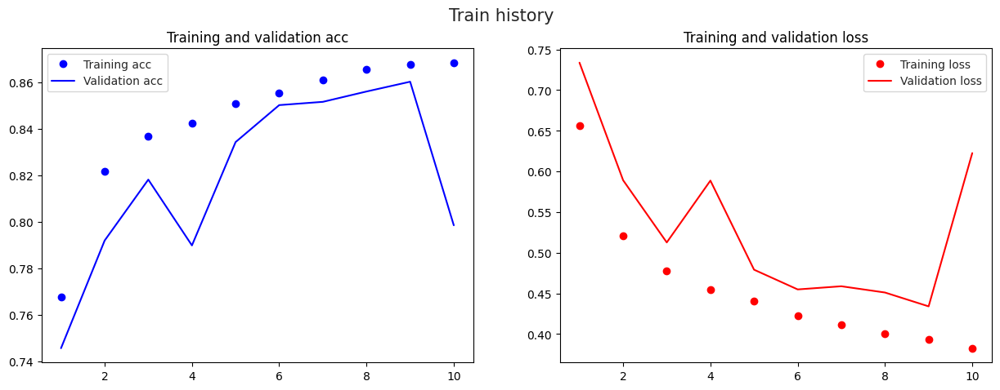

In [ ]:
accuracy = history.history['acc']
val_accuracy = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
sns.set_style("white")
plt.suptitle('Train history', size = 15)

ax1.plot(epochs, accuracy, "bo", label = "Training acc")
ax1.plot(epochs, val_accuracy, "b", label = "Validation acc")
ax1.set_title("Training and validation acc")
ax1.legend()

ax2.plot(epochs, loss, "bo", label = "Training loss", color = 'red')
ax2.plot(epochs, val_loss, "b", label = "Validation loss", color = 'red')
ax2.set_title("Training and validation loss")
ax2.legend()

plt.show()

In [ ]:
model.save('./baseline_model.h5')